In [ ]:
!pip install dtreeviz
!pip install -U imbalanced-learn

Requirement already up-to-date: imbalanced-learn in /usr/local/lib/python3.7/dist-packages (0.8.0)


In [ ]:
pip install -U seaborn

Requirement already up-to-date: seaborn in /usr/local/lib/python3.7/dist-packages (0.11.1)


In [ ]:
!pip install xgboost

In [ ]:
%matplotlib inline
#importing libraries
import numpy as np
import scipy.stats
import scipy.special
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from matplotlib import cm
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline, make_union, Pipeline
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import ParameterGrid
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance
import warnings
import pickle
import csv
import collections
from collections import Counter
from datetime import datetime
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report
import seaborn as sns
import imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import make_scorer
from sklearn.metrics import plot_confusion_matrix
import math
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from IPython.display import HTML
import graphviz
from xgboost import XGBClassifier
from dtreeviz.trees import dtreeviz

from sklearn.calibration import calibration_curve

from itertools import product
from collections import OrderedDict

In [ ]:
warnings.filterwarnings('ignore')

![](https://media-exp1.licdn.com/dms/image/C4E0BAQHorXIctyhPzg/company-logo_200_200/0/1594391987753?e=2159024400&v=beta&t=4msIhxeeWZS5-fEpcavruzRqNoH5g7zPrAvZMGoXwCw)

## **Univ.ai ML2C1 Project**

> Anshika, Nieigl, Sakthisree, Vishnu

We would like to extend our sincere gratitude to Dr. Rahul Dave and our wonderful TAs Anusha, Arya, Hargun, and everyone else for their support. 

# **Higgs-Boson Analysis and Classification**

The discovery of Higgs particle was announced on 4th July 2012. In 2013, Nobel
Prize was conferred upon two scientists, Francois Englert and Peter Higgs for their
contribution towards its discovery. A characteristic property of Higgs Boson is its
decay into other particles through different processes.
At the ATLAS detector at CERN, very high energy protons are accelerated in a
circular trajectory in both directions thus colliding with themselves and resulting in
hundreds of particles per second. 

![](https://media.giphy.com/media/obT4MfCI9FLuU/giphy.gif)

These events are categorized as either
background or signal events. The background events consist of decay of particles
that have already been discovered in previous experiments. The signal events are
the decay of exotic particles: a region in feature space which is not explained by the
background processes. The significance of these signal events is analyzed using
different statistical tests. 

If the probability that the event has not been produced by a
background process is well below a threshold, a new particle is considered to have
been discovered. The ATLAS experiment observed a signal of the Higgs Boson
decaying into two tau particles, although it was buried in significant amount of noise.

## Goal

The goal of the Challenge is to improve the classification procedure that produces the selection
region.The objective is a function of the weights of selected events.
Prefix-less variables EventId, Weight and Label have a special role and should not
be used as input to the classifier. 

The variables prefixed with PRI (for PRImitives) are
“raw” quantities about the bunch collision as measured by the detector, essentially
the momenta of particles. Variables prefixed with DER (for DERived) are quantities
computed from the primitive features.

# **Defining two functions that are used to get a report of our datasets**

In [ ]:
def pretty_print(df):
    return display( HTML( df.to_html().replace("\\n","<br>") ) )
def tbl_report(tbl, cols=None, card=10):
    print("Table Shape", tbl.shape)
    dtypes = tbl.dtypes
    nulls = []
    uniques = []
    numuniques = []
    vcs = []
    for col in dtypes.index:
        n = tbl[col].isnull().sum()
        nulls.append(n)
        strdtcol = str(dtypes[col])
        #if strdtcol == 'object' or strdtcol[0:3] == 'int' or strdtcol[0:3] == 'int':
        #print(strdtcol)
        uniqs = tbl[col].unique()
        uniquenums = uniqs.shape[0]
        if uniquenums < card: # low cardinality
            valcounts = pd.value_counts(tbl[col], dropna=False)
            vc = "\n".join(["{}:{}".format(k,v) for k, v in valcounts.items()])
        else:
            vc='HC' # high cardinality
        uniques.append(uniqs)
        numuniques.append(uniquenums)
        vcs.append(vc)
    nullseries = pd.Series(nulls, index=dtypes.index)
    uniqueseries = pd.Series(uniques, index=dtypes.index)
    numuniqueseries = pd.Series(numuniques, index=dtypes.index)
    vcseries = pd.Series(vcs, index=dtypes.index)
    df = pd.concat([dtypes, nullseries, uniqueseries, numuniqueseries, vcseries], axis=1)
    df.columns = ['dtype', 'nulls', 'uniques', 'num_uniques', 'value_counts']
    if cols:
        return pretty_print(df[cols])
    return pretty_print(df)

# **Loading and Reading Datasets**

The data consists of simulated signal and background events in a 30 dimensional
feature space. Each event data point is assigned an ID and a weight as explained

before. The 30 features consisted of real values and included different kinematic
properties of that event and the particles involved including estimated particle mass,
invariant mass of hadronic tau and lepton, vector sum of the transverse momentum
of hadronic tau, centrality of azimuthal angle, pseudo-rapidity of the leptons, the
number of jets and their properties, etc. The training data consisted of 250,000
events and the test data consisted of 550,000 events. Test data was not
accompanied by weights. Each event of training data was marked by one of two
labels; 's' for signal and 'b' for background.

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

!kaggle kernels list — user Sakzsee — sort-by dateRun

!kaggle competitions download -c higgs-boson

!unzip -q train.csv.zip -d .
!unzip -q test.csv.zip -d .
!ls

kaggle.json
usage: kaggle [-h] [-v] {competitions,c,datasets,d,kernels,k,config} ...
kaggle: error: unrecognized arguments: — user Sakzsee — sort-by dateRun
HiggsBosonCompetition_AMSMetric_rev1.py: Skipping, found more recently modified local copy (use --force to force download)
training.zip: Skipping, found more recently modified local copy (use --force to force download)
random_submission.zip: Skipping, found more recently modified local copy (use --force to force download)
test.zip: Skipping, found more recently modified local copy (use --force to force download)
unzip:  cannot find or open train.csv.zip, train.csv.zip.zip or train.csv.zip.ZIP.
unzip:  cannot find or open test.csv.zip, test.csv.zip.zip or test.csv.zip.ZIP.
HiggsBosonCompetition_AMSMetric_rev1.py  random_submission.zip	test.zip
kaggle.json				 sample_data		training.zip


In [ ]:
#Loading train set and loading test set
train = pd.read_csv("training.zip")
test = pd.read_csv("test.zip")

#EventID is identifier - making it an index in both the sets
train.set_index('EventId',inplace = True)
test.set_index('EventId',inplace=True)

In [ ]:
#Looking at top 5 rows in train
train.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
EventId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,197.760,1.582,1.396,0.2,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,125.157,0.879,1.414,-999.0,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,197.814,3.776,1.414,-999.0,32.154,-0.705,-2.093,121.409,-0.953,1.052,54.283,-2.186,260.414,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,75.968,2.354,-1.285,-999.0,22.647,-1.655,0.010,53.321,-0.522,-3.100,31.082,0.060,86.062,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,57.983,1.056,-1.385,-999.0,28.209,-2.197,-2.231,29.774,0.798,1.569,2.723,-0.871,53.131,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [ ]:
#Looking at training set info 
tbl_report(train, cols=['dtype', 'nulls', 'num_uniques', 'value_counts'])

Table Shape (250000, 32)


,dtype,nulls,num_uniques,value_counts
DER_mass_MMC,float64,0,108338,HC
DER_mass_transverse_met_lep,float64,0,101637,HC
DER_mass_vis,float64,0,100558,HC
DER_pt_h,float64,0,115563,HC
DER_deltaeta_jet_jet,float64,0,7087,HC
DER_mass_jet_jet,float64,0,68366,HC
DER_prodeta_jet_jet,float64,0,16593,HC
DER_deltar_tau_lep,float64,0,4692,HC
DER_pt_tot,float64,0,59042,HC
DER_sum_pt,float64,0,156098,HC


In [ ]:
#Looking at the numerical descriptions
train.describe()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight
count,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000
mean,-49.023079,49.239819,81.181982,57.895962,-708.420675,-601.237051,-709.356603,2.373100,18.917332,158.432217,1.437609,-0.128305,-708.985189,38.707419,-0.010973,-0.008171,46.660207,-0.019507,0.043543,41.717235,-0.010119,209.797178,0.979176,-348.329567,-399.254314,-399.259788,-692.381204,-709.121609,-709.118631,73.064591,1.646767
std,406.345647,35.344886,40.828691,63.655682,454.480565,657.972302,453.019877,0.782911,22.273494,115.706115,0.844743,1.193585,453.596721,22.412081,1.214079,1.816763,22.064922,1.264982,1.816611,32.894693,1.812223,126.499506,0.977426,532.962789,489.338286,489.333883,479.875496,453.384624,453.389017,98.015662,1.875103
min,-999.000000,0.000000,6.329000,0.000000,-999.000000,-999.000000,-999.000000,0.208000,0.000000,46.104000,0.047000,-1.414000,-999.000000,20.000000,-2.499000,-3.142000,26.000000,-2.505000,-3.142000,0.109000,-3.142000,13.678000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.001502
25%,78.100750,19.241000,59.388750,14.068750,-999.000000,-999.000000,-999.000000,1.810000,2.841000,77.550000,0.883000,-1.371000,-999.000000,24.591750,-0.925000,-1.575000,32.375000,-1.014000,-1.522000,21.398000,-1.575000,123.017500,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.018636
50%,105.012000,46.524000,73.752000,38.467500,-999.000000,-999.000000,-999.000000,2.491500,12.315500,120.664500,1.280000,-0.356000,-999.000000,31.804000,-0.023000,-0.033000,40.516000,-0.045000,0.086000,34.802000,-0.024000,179.739000,1.000000,38.960000,-1.872000,-2.093000,-999.000000,-999.000000,-999.000000,40.512500,1.156188
75%,130.606250,73.598000,92.259000,79.169000,0.490000,83.446000,-4.593000,2.961000,27.591000,200.478250,1.777000,1.225000,0.000000,45.017000,0.898000,1.565000,53.390000,0.959000,1.618000,51.895000,1.561000,263.379250,2.000000,75.349000,0.433000,0.503000,33.703000,-2.457000,-2.275000,109.933750,2.404128
max,1192.026000,690.075000,1349.351000,2834.999000,8.503000,4974.979000,16.690000,5.684000,2834.999000,1852.462000,19.773000,1.414000,1.000000,764.408000,2.497000,3.142000,560.271000,2.503000,3.142000,2842.617000,3.142000,2003.976000,3.000000,1120.573000,4.499000,3.141000,721.456000,4.500000,3.142000,1633.433000,7.822543


In [ ]:
#Looking at top 5 rows in test
test.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
EventId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
350000,-999.000,79.589,23.916,3.036,-999.000,-999.000,-999.000,0.903,3.036,56.018,1.536,-1.404,-999.000,22.088,-0.540,-0.609,33.930,-0.504,-1.511,48.509,2.022,98.556,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,-0.000
350001,106.398,67.490,87.949,49.994,-999.000,-999.000,-999.000,2.048,2.679,132.865,1.777,-1.204,-999.000,30.716,-1.784,3.054,54.574,-0.169,1.795,21.093,-1.138,176.251,1,47.575,-0.553,-0.849,-999.000,-999.000,-999.000,47.575
350002,117.794,56.226,96.358,4.137,-999.000,-999.000,-999.000,2.755,4.137,97.600,1.096,-1.408,-999.000,46.564,-0.298,3.079,51.036,-0.548,0.336,19.461,-1.868,111.505,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.000
350003,135.861,30.604,97.288,9.104,-999.000,-999.000,-999.000,2.811,9.104,94.112,0.819,-1.382,-999.000,51.741,0.388,-1.408,42.371,-0.295,2.148,25.131,1.172,164.707,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.000
350004,74.159,82.772,58.731,89.646,1.347,536.663,-0.339,1.028,77.213,721.552,1.713,-0.913,0.004,45.087,-1.548,1.877,77.252,-1.913,2.838,22.200,-0.231,869.614,3,254.085,-1.013,-0.334,185.857,0.335,2.587,599.213


In [ ]:
#Looking at test info
tbl_report(test, cols=['dtype', 'nulls', 'num_uniques', 'value_counts'])

Table Shape (550000, 30)


,dtype,nulls,num_uniques,value_counts
DER_mass_MMC,float64,0,152743,HC
DER_mass_transverse_met_lep,float64,0,123271,HC
DER_mass_vis,float64,0,134982,HC
DER_pt_h,float64,0,165204,HC
DER_deltaeta_jet_jet,float64,0,7487,HC
DER_mass_jet_jet,float64,0,140826,HC
DER_prodeta_jet_jet,float64,0,20258,HC
DER_deltar_tau_lep,float64,0,4900,HC
DER_pt_tot,float64,0,76134,HC
DER_sum_pt,float64,0,241132,HC


In [ ]:
#Looking at statistical description of test
test.describe()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
count,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000,550000.000000
mean,-48.950144,49.261093,81.123904,57.824801,-707.448878,-599.705905,-708.391425,2.374076,18.988277,158.659749,1.439415,-0.126942,-708.015756,38.696831,-0.011861,-0.015815,46.714062,-0.018781,0.051797,41.627231,-0.008214,209.933695,0.980171,-348.946684,-399.883839,-399.896234,-691.309277,-708.150605,-708.153058,73.248856
std,406.233686,35.425422,40.435560,63.291314,454.928791,659.129589,453.461222,0.779895,21.767376,116.237589,0.845026,1.194503,454.043330,22.421603,1.213344,1.816023,22.174519,1.264147,1.814055,32.324457,1.812777,126.910079,0.979271,533.155176,489.467786,489.457747,480.435230,453.834190,453.830095,98.467134
min,-999.000000,0.000000,6.810000,0.000000,-999.000000,-999.000000,-999.000000,0.237000,0.000000,46.103000,0.055000,-1.414000,-999.000000,20.000000,-2.499000,-3.142000,26.000000,-2.508000,-3.142000,0.051000,-3.142000,13.847000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-0.000000
25%,78.167750,19.313000,59.422000,14.192000,-999.000000,-999.000000,-999.000000,1.815000,2.838000,77.471000,0.886000,-1.371000,-999.000000,24.582000,-0.926000,-1.588000,32.378000,-1.011000,-1.508000,21.374000,-1.574000,122.984750,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000
50%,105.076000,46.455500,73.747000,38.469500,-999.000000,-999.000000,-999.000000,2.492000,12.390000,120.701500,1.282000,-0.356000,-999.000000,31.770000,-0.021000,-0.042000,40.561500,-0.038000,0.097000,34.758000,-0.017000,179.949000,1.000000,38.970000,-1.862000,-2.111000,-999.000000,-999.000000,-999.000000,40.503500
75%,130.769000,73.646000,92.173000,79.234250,0.503000,84.266250,-4.538000,2.962000,27.649000,201.018000,1.779000,1.230000,0.000000,44.883000,0.899000,1.557000,53.387000,0.956000,1.617000,51.922000,1.558000,263.917250,2.000000,75.499000,0.431000,0.484000,33.832000,-2.429000,-2.260000,110.507000
max,1949.261000,968.669000,1264.965000,1337.187000,8.724000,4794.827000,17.294000,5.751000,759.363000,2079.162000,32.228000,1.414000,1.000000,627.023000,2.500000,3.142000,701.328000,2.506000,3.142000,1254.363000,3.142000,2190.275000,3.000000,1163.439000,4.500000,3.142000,817.801000,4.500000,3.142000,1860.175000


In [ ]:
train.shape, test.shape

((250000, 32), (550000, 30))

# **Exploratory Data Analysis**


In [ ]:
#Splitting into X and y
X = train.drop(['Label','Weight'], axis = 1)
y = pd.factorize(train['Label'])[0]
print('Shape of X: {}'.format(X.shape))
print('Shape of y: {}'.format(y.shape))

Shape of X: (250000, 30)
Shape of y: (250000,)


## Let us look at the Class Ratio in our dataset.

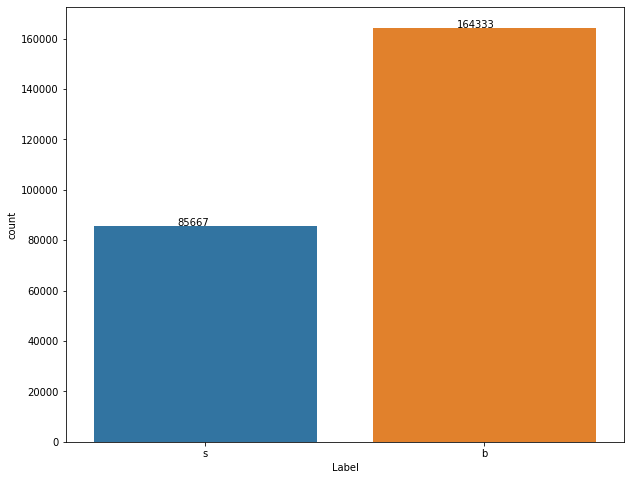

In [ ]:
#Let's see the count of each class in our label
plt.figure(figsize=(10,8))
ax = sns.countplot(train['Label']);
for p in ax.patches:
        ax.annotate('{:d}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+5));

Looks like we do indeed have an imbalanced dataset. Considering this, accuracy would not be a good metric of performance. F1 score would be a better fit.

## **Univariate Analysis**

## Finding distribution of each Feature

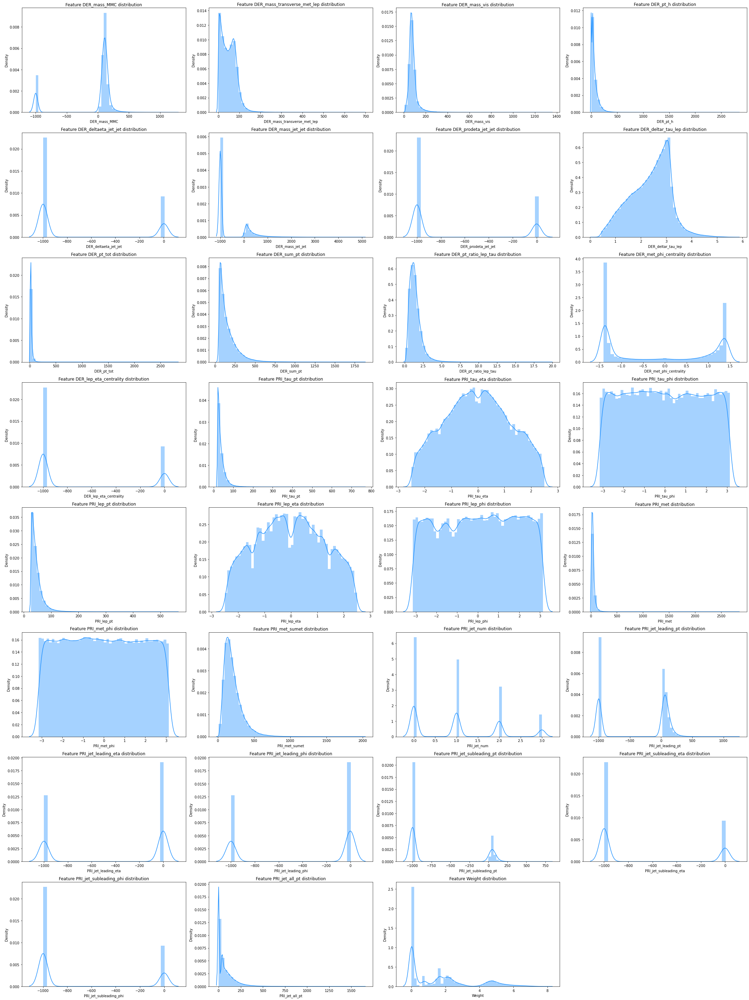

In [ ]:
#Plotting Distribution of each feature
fig=plt.figure(figsize=(30,40))

for i in range(np.shape(train)[1]-1):
    ax = fig.add_subplot(8,4,i+1)
    ax = sns.distplot(train.iloc[:,i], color = 'dodgerblue')
    ax.set_title("Feature "+ train.columns[i] +" distribution")
fig.tight_layout();

From the above, we see a lot of features that are skewed in nature. Hence, we will be log transforming them later.

### Finding the distribution of Data Per Class

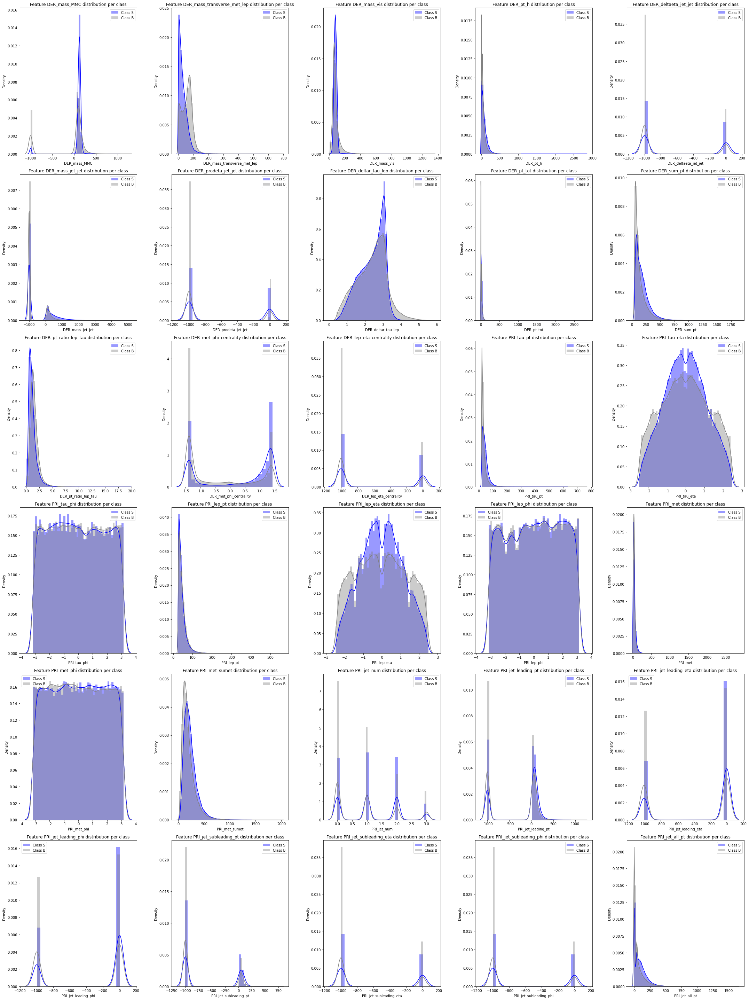

In [ ]:
#Plotting Distribution of features per class
fig=plt.figure(figsize=(30,40))

for i in range(np.shape(train)[1]-2):
    ax = fig.add_subplot(6,5,i+1)
    ax = sns.distplot(train[train['Label'] == 's'].iloc[:,i],label="Class S", color = "blue")
    ax = sns.distplot(train[train['Label'] == 'b'].iloc[:,i],label="Class B", color = "grey")
    ax.set_title("Feature "+ train.columns[i] +" distribution per class")
    ax.legend()
fig.tight_layout();

## **Bivariate Analysis**

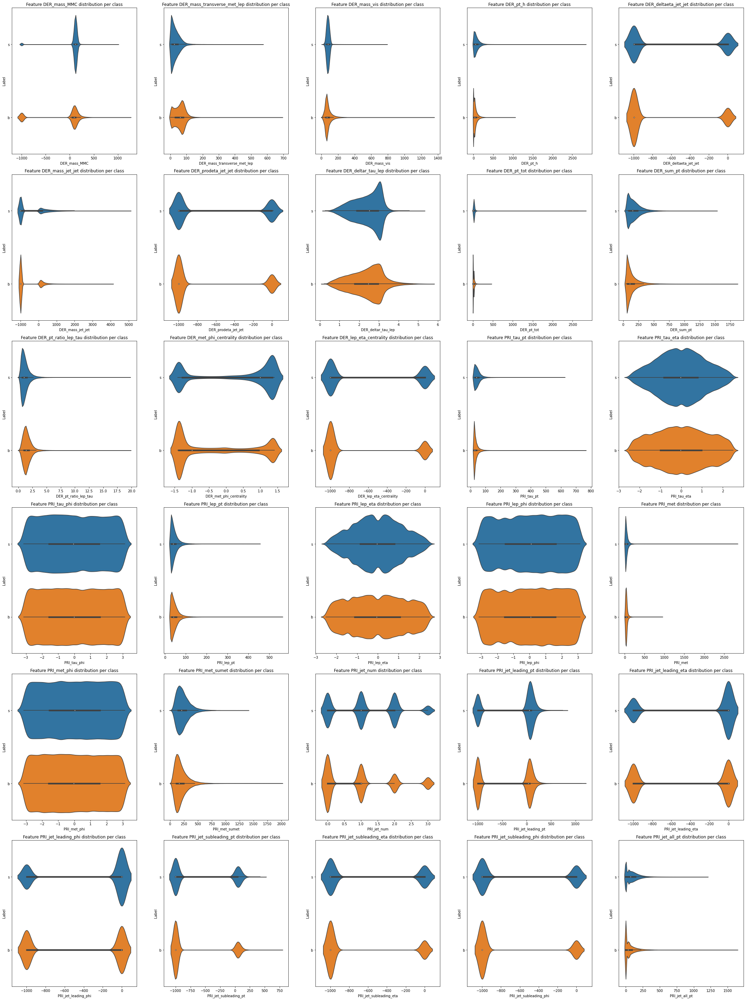

In [ ]:
fig=plt.figure(figsize=(30,40))

for i in range(np.shape(train)[1]-2):
    ax = fig.add_subplot(6,5,i+1)
    ax = sns.violinplot(train.iloc[:,i],train['Label'])
    ax.set_title("Feature "+ train.columns[i] +" distribution per class")
fig.tight_layout();

### Finding highly correlated Features - and printing the pairs of highly correlated features with threshold of 0.85

In [ ]:
train.corr().style.background_gradient(cmap='Blues')

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight
DER_mass_MMC,1.000000,-0.455755,0.168548,0.198765,0.162661,0.160524,0.162521,0.228105,0.045826,0.201464,-0.017073,0.358963,0.162623,0.131495,0.002579,-0.006177,0.099445,0.010060,-0.000744,-0.233724,0.007411,0.221984,0.221078,0.250158,0.247083,0.247078,0.162836,0.162614,0.162609,0.185372,-0.327244
DER_mass_transverse_met_lep,-0.455755,1.000000,0.190109,-0.249116,-0.176386,-0.190392,-0.175942,0.043251,0.017758,-0.146837,0.349504,-0.419757,-0.176262,-0.145464,-0.002109,0.001132,0.310648,-0.006777,0.000340,0.183716,-0.015925,-0.167811,-0.210537,-0.229674,-0.220370,-0.220355,-0.176837,-0.176231,-0.176225,-0.210009,0.419843
DER_mass_vis,0.168548,0.190109,1.000000,-0.062562,-0.032251,-0.040620,-0.032126,0.579712,-0.000702,0.088685,0.097490,-0.090846,-0.032220,0.290011,0.002127,-0.003624,0.405482,0.002196,-0.002018,-0.087330,-0.001467,0.053300,-0.026860,-0.019151,-0.013749,-0.013742,-0.033188,-0.032202,-0.032206,-0.052902,0.102172
DER_pt_h,0.198765,-0.249116,-0.062562,1.000000,0.523664,0.534531,0.523639,-0.539379,0.310501,0.832733,0.089187,0.539356,0.523720,0.407421,0.001665,0.005248,0.360939,0.008354,-0.002923,0.679585,0.008585,0.782547,0.623401,0.621599,0.564898,0.564894,0.531647,0.523714,0.523703,0.808616,-0.414084
DER_deltaeta_jet_jet,0.162661,-0.176386,-0.032251,0.523664,1.000000,0.946045,0.999981,-0.299076,0.270878,0.671996,0.041307,0.368492,0.999998,0.188086,0.004866,0.003302,0.168039,0.008678,0.000069,0.305561,0.005245,0.619100,0.867521,0.545027,0.521657,0.521664,0.999346,0.999995,0.999996,0.712446,-0.395375
DER_mass_jet_jet,0.160524,-0.190392,-0.040620,0.534531,0.946045,1.000000,0.944443,-0.303751,0.247771,0.680700,0.027674,0.369803,0.945584,0.204106,0.003584,0.003321,0.164026,0.007602,-0.000596,0.318497,0.005167,0.617057,0.814191,0.521645,0.493233,0.493241,0.947652,0.945505,0.945507,0.719962,-0.394004
DER_prodeta_jet_jet,0.162521,-0.175942,-0.032126,0.523639,0.999981,0.944443,1.000000,-0.299083,0.271435,0.672158,0.041614,0.368177,0.999990,0.187936,0.004880,0.003309,0.168270,0.008692,0.000070,0.305678,0.005254,0.619388,0.867741,0.545022,0.521653,0.521661,0.999347,0.999988,0.999989,0.712620,-0.395004
DER_deltar_tau_lep,0.228105,0.043251,0.579712,-0.539379,-0.299076,-0.303751,-0.299083,1.000000,-0.148081,-0.432603,0.047046,-0.205441,-0.299115,-0.202035,0.003632,-0.011229,-0.069957,0.000699,-0.000776,-0.402345,-0.001570,-0.407002,-0.347904,-0.335851,-0.304161,-0.304145,-0.303416,-0.299107,-0.299101,-0.448737,0.197881
DER_pt_tot,0.045826,0.017758,-0.000702,0.310501,0.270878,0.247771,0.271435,-0.148081,1.000000,0.381160,0.039193,0.178448,0.271058,0.095754,0.003596,0.001452,0.109617,0.007987,-0.004249,0.269739,0.002515,0.448925,0.360409,0.202920,0.186564,0.186590,0.279203,0.271100,0.271091,0.403382,-0.219507
DER_sum_pt,0.201464,-0.146837,0.088685,0.832733,0.671996,0.680700,0.672158,-0.432603,0.381160,1.000000,0.108791,0.420679,0.672116,0.485847,0.002037,0.003931,0.460938,0.008781,-0.001892,0.520129,0.006712,0.904481,0.758503,0.638796,0.578616,0.578621,0.687465,0.672125,0.672114,0.965628,-0.414827


### Printing out the highly correlated features along with their correlation

In [ ]:
#List to store the features with high correlation as tuples
feat=[]
#Setting a threshold of 0.9 of correlation
threshold=0.9
correlation=X.corr()
for i in X.columns:
    temp=correlation[i]
    #Finding the correlated features greater than the threshold
    corr_features=temp[(abs(temp)>threshold) & (temp.index!=i)].index.values
    #Adding the correlated features into a list keeping in mind that there is only one occurrence of the feature combination
    if(len(corr_features)!=0):
        for j in corr_features:
            features=(i,j)
        
            if(len(feat)==0):
                feat.append(features)
            else:
                count=len(feat)
                for x in feat:
                    if set(x) != set(features):
                        count-=1  
                    else:
                        break
                if(count==0):
                    feat.append(features)
                #[feat.append(features) for x in feat if not (set(x)==set(features))]

In [ ]:
print("The highly correlated features are given below")
for i in feat:
    corr=correlation[i[0]][i[1]]
    print('Features '+i[0]+' and '+i[1]+' are correlated with a correlation index of '+ str(np.round(corr,2)))

The highly correlated features are given below
Features DER_deltaeta_jet_jet and DER_mass_jet_jet are correlated with a correlation index of 0.95
Features DER_deltaeta_jet_jet and DER_prodeta_jet_jet are correlated with a correlation index of 1.0
Features DER_deltaeta_jet_jet and DER_lep_eta_centrality are correlated with a correlation index of 1.0
Features DER_deltaeta_jet_jet and PRI_jet_subleading_pt are correlated with a correlation index of 1.0
Features DER_deltaeta_jet_jet and PRI_jet_subleading_eta are correlated with a correlation index of 1.0
Features DER_deltaeta_jet_jet and PRI_jet_subleading_phi are correlated with a correlation index of 1.0
Features DER_mass_jet_jet and DER_prodeta_jet_jet are correlated with a correlation index of 0.94
Features DER_mass_jet_jet and DER_lep_eta_centrality are correlated with a correlation index of 0.95
Features DER_mass_jet_jet and PRI_jet_subleading_pt are correlated with a correlation index of 0.95
Features DER_mass_jet_jet and PRI_jet_s

## **Getting the Data Ready**

Since we have an imbalanced dataset, we are using SMOTE for upsampling and downsampling our dataset.

## A) Dropping Highly Correlated Features

Correlation implies that there is little information contained in any linear combination of the concerned features. Removing the correlation by reducing the number of features through PCA, ICA, etc. can be seen to smooth out noise and simplify the model.

In [ ]:
count = {}
for i, j in feat:
    if i in count.keys():
        count[i]+= 1
    else:
        count[i] = 1
    if j in count.keys():
        count[j]+= 1
    else:
        count[j] = 1
for k, v in count.items():
    if v > 2:
        X.drop(k, axis = 1, inplace = True)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 250000 entries, 100000 to 349999
Data columns (total 23 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   DER_mass_MMC                 250000 non-null  float64
 1   DER_mass_transverse_met_lep  250000 non-null  float64
 2   DER_mass_vis                 250000 non-null  float64
 3   DER_pt_h                     250000 non-null  float64
 4   DER_deltar_tau_lep           250000 non-null  float64
 5   DER_pt_tot                   250000 non-null  float64
 6   DER_sum_pt                   250000 non-null  float64
 7   DER_pt_ratio_lep_tau         250000 non-null  float64
 8   DER_met_phi_centrality       250000 non-null  float64
 9   PRI_tau_pt                   250000 non-null  float64
 10  PRI_tau_eta                  250000 non-null  float64
 11  PRI_tau_phi                  250000 non-null  float64
 12  PRI_lep_pt                   250000 non-null  float64

## B) Log Transformation of the features

The log transformation is, arguably, the most popular among the different types of transformations used to transform skewed data to approximately conform to normality. If the original data follows a log-normal distribution or approximately so, then the log-transformed data follows a normal or near normal distribution.

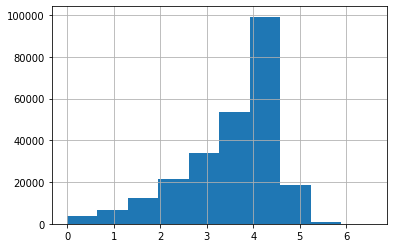

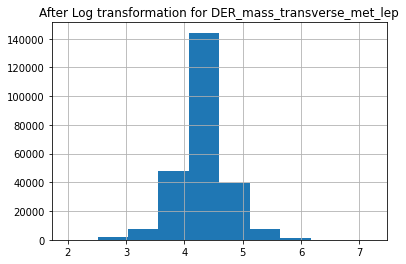

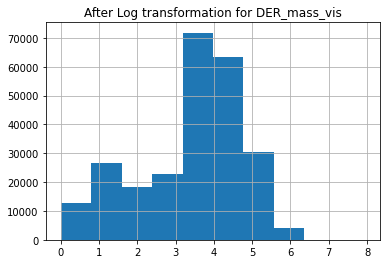

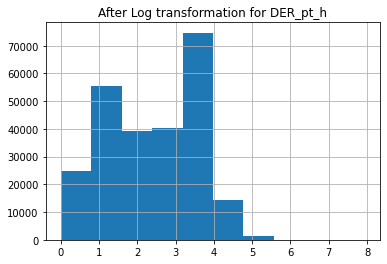

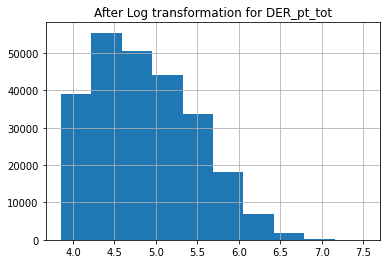

...

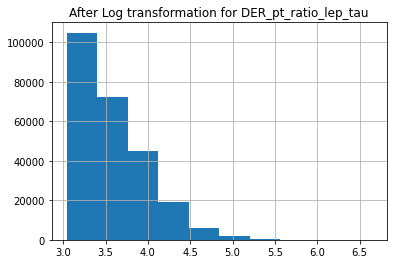

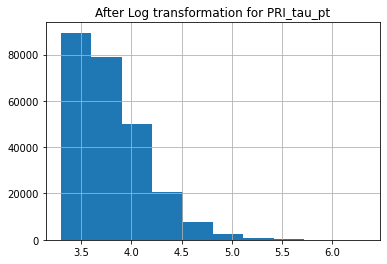

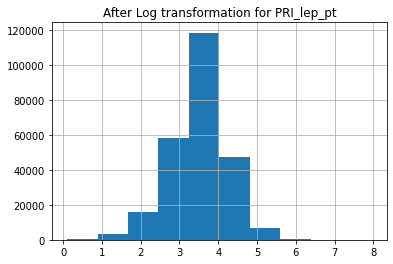

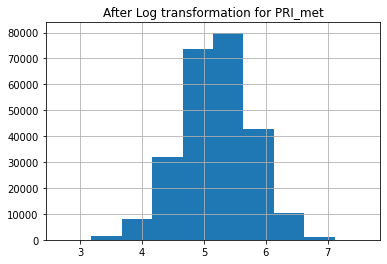

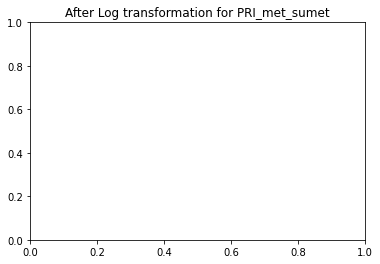

In [ ]:
from sklearn.preprocessing import FunctionTransformer

transformer = FunctionTransformer(np.log2, validate = True)

log_features = ['DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'PRI_tau_pt',
       'PRI_lep_pt',
       'PRI_met', 'PRI_met_sumet']      

X = X[log_features].applymap(lambda x: np.log(x+1))

for i in log_features:
    X[i].hist()
    plt.show()
    plt.title("After Log transformation for " +i)

## C) SMOTE Technique

The challenge of working with imbalanced datasets is that most machine learning techniques will ignore, and in turn have poor performance on, the minority class, although typically it is performance on the minority class that is most important.

One approach to addressing imbalanced datasets is to oversample the minority class. The simplest approach involves duplicating examples in the minority class, although these examples don’t add any new information to the model. Instead, new examples can be synthesized from the existing examples. This is a type of data augmentation for the minority class and is referred to as the Synthetic Minority Oversampling Technique, or SMOTE for short.

In [ ]:
counter = Counter(y)
print('Before', counter)

smt = SMOTE()

#oversampling using SMOTE
X_sm, y_sm = smt.fit_resample(X,y)

counter = Counter(y_sm)
print('After', counter)

#Creating a Resampled Dataframe
X_sm_df = pd.DataFrame(X_sm, columns=X.columns)
y_sm_df = pd.DataFrame(y_sm, columns = ['Label'])

Before Counter({1: 164333, 0: 85667})
After Counter({0: 164333, 1: 164333})


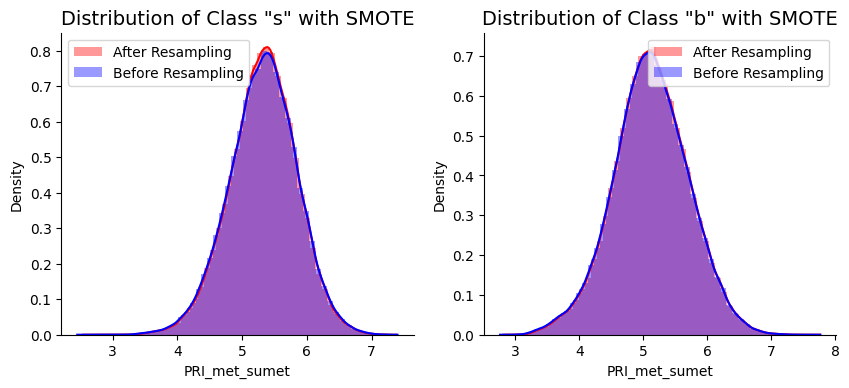

In [ ]:
temp_df = pd.concat([X_sm_df,y_sm_df],axis=1)

f, axes = plt.subplots(figsize=(10, 4), dpi=100)
plt.subplot(121)
sns.despine()
sns.distplot(temp_df[temp_df['Label']==0]['PRI_met_sumet'],label='After Resampling',color='red')
sns.distplot(np.log(train[train['Label']=='s']['PRI_met_sumet']),label='Before Resampling',color='blue')
plt.title('Distribution of Class "s" with SMOTE', fontsize=14);
plt.legend();


plt.subplot(122)
sns.despine()
sns.distplot(temp_df[temp_df['Label']==1]['PRI_met_sumet'],label='After Resampling',color='red')
sns.distplot(np.log(train[train['Label']=='b']['PRI_met_sumet']),label='Before Resampling',color='blue')
plt.title('Distribution of Class "b" with SMOTE', fontsize=14);
plt.legend();



If you look at the X axis, clearly the upsampling has happened.

## Utility Functions to make Model building and Cross-validation easier.

In [ ]:
def cv_optimize(clf, parameters, X, y, n_jobs=1, n_folds=5, score_func=None,oob_func=False):
    if ((not oob_func) and score_func):
        print("SCORE FUNC", score_func)
        gs = GridSearchCV(clf, param_grid=parameters, cv=n_folds, n_jobs=n_jobs, scoring=score_func)
    
    elif oob_func:
        print("OOB_Score")
        
        results = {}
        estimators= {}
        for n_est,mf,md in product(*parameters.values()):
            
            params = (n_est,mf,md)
            
            clf = RandomForestClassifier(random_state = 2017, n_estimators = n_est, max_features = mf, max_depth = md, oob_score=True, n_jobs = -1)
            
            clf.fit(X,y)
            
            results[params] = clf.oob_score_
            estimators[params] = clf
            
        outparams = max(results, key = results.get)
        
        print("Best Params: ",outparams)
        best_estimator = estimators[outparams]
        
        print("Training Score: ",best_estimator.score(X, y)) 
        print("OOB Score: ",best_estimator.oob_score_)
        
        return best_estimator

        
    else:
        gs = GridSearchCV(clf, param_grid=parameters, n_jobs=n_jobs, cv=n_folds)
        
    gs.fit(X, y)
    print("BEST", gs.best_params_, gs.best_score_)
    best = gs.best_estimator_
    return best

def do_classify(clf, parameters, indf,y,score_func, n_folds=5, n_jobs=1,oob_func=False):
    X=indf
    y=y
    Xtrain,Xtest,ytrain,ytest=train_test_split(X,y,train_size=0.8,random_state=2017)
    
    if oob_func:
        
        clf = cv_optimize(clf, parameters, Xtrain, ytrain, n_jobs=n_jobs, n_folds=n_folds, oob_func=True)
        
    else:
        clf = cv_optimize(clf, parameters, Xtrain, ytrain, n_jobs=n_jobs, n_folds=n_folds, score_func=score_func)
    
    
    training_accuracy = clf.score(Xtrain, ytrain)
    test_accuracy = clf.score(Xtest, ytest)
    
    print("############# based on standard predict ################")
    print("Accuracy on training data: %0.2f" % (training_accuracy))
    print("Accuracy on test data:     %0.2f" % (test_accuracy))
    
    print(confusion_matrix(ytest, clf.predict(Xtest)))
    
    print("########################################################")
    plot_confusion_matrix(clf,Xtest,ytest,cmap="Blues")
    return clf, Xtrain, ytrain, Xtest,ytest

def make_roc(name, clf, ytest, xtest, ax=None, labe=5,  proba=True, skip=0, initial = False):
    if not ax:
        ax=plt.gca()
    if proba:
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    roc_auc = auc(fpr, tpr)
    if skip:
        l=fpr.shape[0]
        ax.plot(fpr[0:l:skip], tpr[0:l:skip], '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    else:
        ax.plot(fpr, tpr, '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
    )
    for k in range(0, fpr.shape[0],labe):
        #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
        threshold = str(np.round(thresholds[k], 2))
        ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    if initial:
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC')
    ax.legend(loc="lower right")
    return ax

def make_pr(name,clf,ytest,xtest,ax=None):
    
    scores = clf.predict_proba(xtest)[:,1]
    precision, recall, _ = precision_recall_curve(ytest, scores)
    
    ax.plot(recall,precision,'*-',label="Precision-Recall Curve for %s (area = %0.2f)" % (name,average_precision_score(ytest,scores)) )
    ax.set_xlim([-0.01,1.01])
    ax.set_ylim([-0.01,1.01])
    ax.set_xlabel('Recall', fontsize=12)
    ax.set_ylabel('Precision', fontsize=12)
    ax.grid()
    plt.tight_layout()
    plt.legend()
    return ax

def calibration_plot(name,clf, xtest, ytest):

    fig, ax = plt.subplots(2,1,figsize=(8,15))
    fop, mpv = calibration_curve(ytest,clf.predict_proba(xtest)[:,1], n_bins=20)
    count = 0
    ax[0].plot(mpv, fop, marker='*',label="Calibration curve for %s" %(name))
    ax[0].plot([0,1],[0,1])
    ax[1].hist(clf.predict_proba(xtest)[:, 1], range=(0, 1), bins=20)
    rect=ax[1].patches
    fig.legend()

def p_importance(model, cols, fi, fistd = 0):
    return pd.DataFrame({'features':cols, 'importance':fi, 'importance_std': fistd}
                       ).sort_values('importance', ascending=False)

def plot_perm_importance(name,model,Xtest,ytest,last=False,number=10):
    
    imp = permutation_importance(model,Xtest,ytest)

    xgf_df=p_importance(imp,Xtest.columns,imp['importances_mean'],imp['importances_std'])

    fig,ax=plt.subplots(figsize=(17,10))
    
    if last:
        sns.barplot(data=xgf_df[-number:],x='features',y='importance',label='%s_importances'%(name),ax=ax)
        
    else:
        sns.barplot(data=xgf_df[:number],x='features',y='importance',label='%s_importances'%(name),ax=ax)
    
    plt.xticks(rotation='45')
    plt.title("Bar plot of Importances for %s"%(name));
    
    return xgf_df


# Setting up Baseline Model

When trying to develop a scientific understanding of the world, most fields start with broad strokes before exploring important details. In Physics for example, we start with simple models (Newtonian physics) and progressively dive into more complex ones (Relativity) as we learn which of our initial assumptions were wrong. This allows us to solve problems efficiently, by reasoning at the simplest useful level.

Fundamentally, a baseline is a model that is both simple to set up and has a reasonable chance of providing decent results. Experimenting with them is usually quick and low cost, since implementations are widely available in popular packages.

In our case, we shall take Logistic Regression as our baseline model to set the line on which we will further improve model performance.

## Setting up Pipeline for Baseline Logistic Regression Model

SCORE FUNC roc_auc
BEST {'model__C': 1000} 0.7648091685625714
############# based on standard predict ################
Accuracy on training data: 0.71
Accuracy on test data:     0.72
[[ 7153  9946]
 [ 4287 28614]]
########################################################


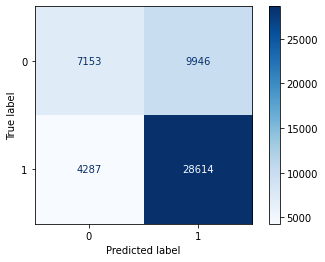

In [ ]:
# set up standardization
ss = StandardScaler()

# oe hot encoding
oh = OneHotEncoder()

cont_vars = X.columns.to_list()
cat_vars = []

# continuous variables need to be standardized
cont_pipe = Pipeline([("scale", ss)])

# categorical variables need to be one hot encoded
cat_pipe = Pipeline([('onehot', oh)])

# combine both into a transformer
transformers = [('cont', cont_pipe, cont_vars), ('cat', cat_pipe, cat_vars)]

# apply transformer to relevant columns. Nothing will be done for the rest
ct = ColumnTransformer(transformers=transformers, remainder="passthrough")

# create a pipeline so that we are not leaking data from validation to train in the individual folds
pipe = Pipeline(steps=[('ct', ct), ('model', LogisticRegression(max_iter=10000, penalty='l2'))])

# in paramgrid we dont use C but use model__C corresponding to the name in the pipeline
paramgrid = dict(model__C=[1000, 100, 10])

#Now we train our model. Our do_classify takes care of subsetting the data and pickinging up the target variable.We score using the AUC on the validation sets.
lr, Xtrain, ytrain, Xtest, ytest = do_classify(pipe, paramgrid,X, y, score_func='roc_auc')

In [ ]:
print(classification_report(ytest,lr.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.63      0.42      0.50     17099
           1       0.74      0.87      0.80     32901

    accuracy                           0.72     50000
   macro avg       0.68      0.64      0.65     50000
weighted avg       0.70      0.72      0.70     50000



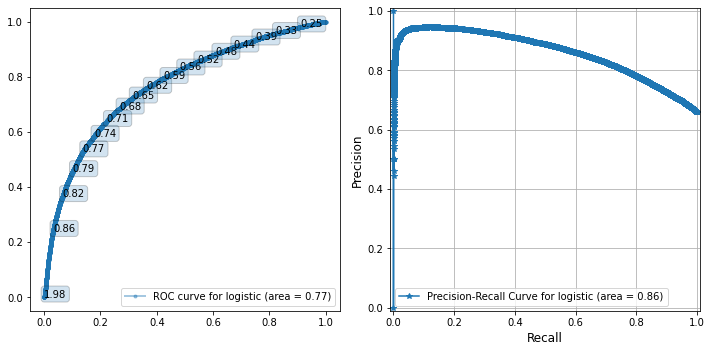

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,5))

make_roc('logistic', lr, ytest , Xtest, ax=ax[0],labe=1000, initial = False)
make_pr('logistic', lr, ytest, Xtest,ax=ax[1]);

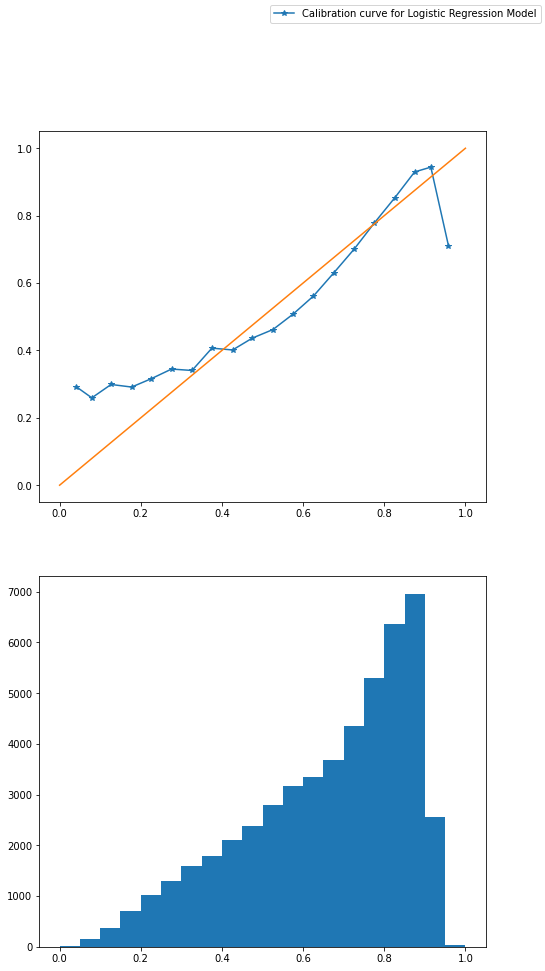

In [ ]:
 calibration_plot("Logistic Regression Model",lr, Xtest, ytest)

From above, we are able to infer that the accuracy achieved is around 71% for the Logistic Regression model with the F1 Score being an avg of 70%. The data fed into this is imbalanced. Perhaps, that may be the reason why the accuracy dipped.

## Setting up Pipeline for Decision Tree Classifier


Decision Tree algorithm belongs to the family of supervised learning algorithms. Unlike other supervised learning algorithms, the decision tree algorithm can be used for solving regression and classification problems too.

The goal of using a Decision Tree is to create a training model that can use to predict the class or value of the target variable by learning simple decision rules inferred from prior data(training data).

In Decision Trees, for predicting a class label for a record we start from the root of the tree. We compare the values of the root attribute with the record’s attribute. On the basis of comparison, we follow the branch corresponding to that value and jump to the next node.

SCORE FUNC roc_auc
BEST {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 4} 0.8628696424034761
############# based on standard predict ################
Accuracy on training data: 0.79
Accuracy on test data:     0.78
[[25850  7146]
 [ 7057 25681]]
########################################################


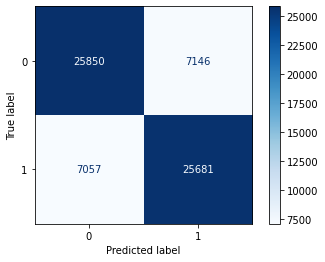

In [ ]:
# Create a pipeline so that we are not leaking data from validation to train in the individual folds
dt = DecisionTreeClassifier(random_state=142)
paramgrid_dt = {'max_depth':range(1,9),'min_samples_leaf':range(3,5),'criterion':['gini']}

dt, Xtrain, ytrain, Xtest,ytest = do_classify(dt, paramgrid_dt,X_sm,y_sm,'roc_auc',n_folds=5,n_jobs=-1)

In [ ]:
print(classification_report(ytest,dt.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.79      0.78      0.78     32996
           1       0.78      0.78      0.78     32738

    accuracy                           0.78     65734
   macro avg       0.78      0.78      0.78     65734
weighted avg       0.78      0.78      0.78     65734



In [ ]:
colors = [None, None,['red','blue'],]
dt_viz = dtreeviz(dt, X_sm,y_sm,
               feature_names = X_sm.columns,
               target_name = 'Label', class_names= ['Yes','No'],orientation = 'TD',
               colors={'classes':colors},
               label_fontsize=12,
               ticks_fontsize=10,
               )

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


In [ ]:
dt_viz.save("DecisionTree.svg")

In [ ]:
dt_viz

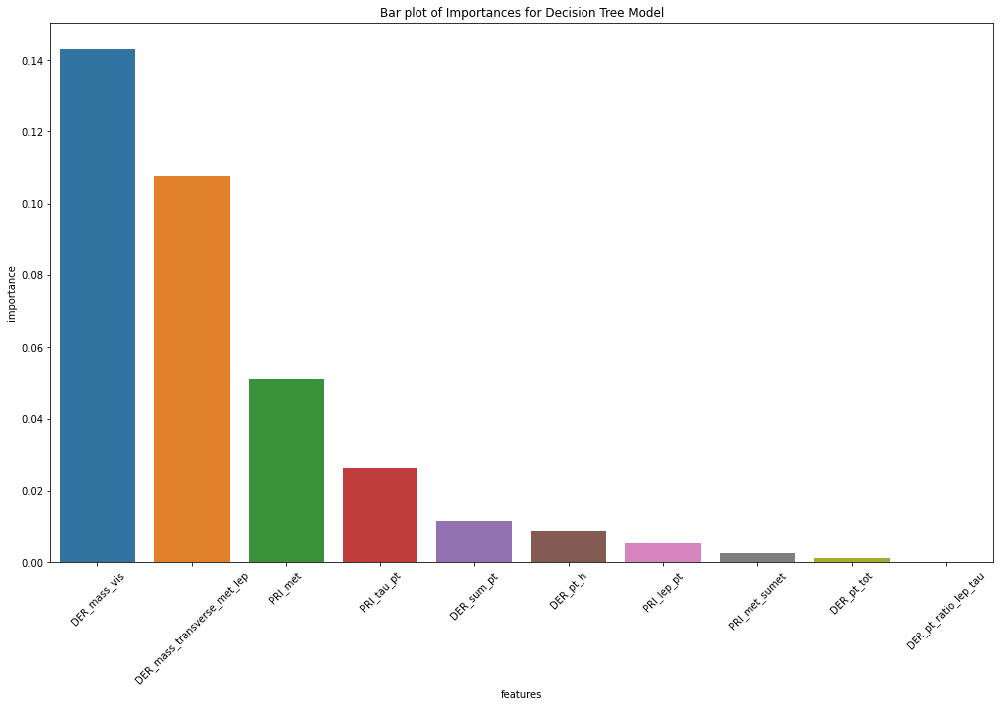

In [ ]:
dimp = permutation_importance(dt,Xtest,ytest)
ddf = p_importance(dt,list(X_sm.columns),dimp['importances_mean'],dimp['importances_std']).iloc[:10]

#Plotting Feature Importance Graphs
fig,ax=plt.subplots(figsize=(17,10))
sns.barplot(data=ddf,x='features',y='importance',label='Decision_importances',ax=ax)
plt.xticks(rotation='45')
plt.title("Bar plot of Importances for Decision Tree Model");

# Working on Ensemble-Tree Models

Ensemble methods, which combines several decision trees to produce better predictive performance than utilizing a single decision tree. The main principle behind the ensemble model is that a group of weak learners come together to form a strong learner.

Let’s talk about few techniques to perform ensemble decision trees:
1. Bagging
2. Boosting

Bagging (Bootstrap Aggregation) is used when our goal is to reduce the variance of a decision tree. Here idea is to create several subsets of data from training sample chosen randomly with replacement. Now, each collection of subset data is used to train their decision trees. As a result, we end up with an ensemble of different models. Average of all the predictions from different trees are used which is more robust than a single decision tree.

## Trying out Boosting Models

Gradient Boosting is an extension over boosting method.
Gradient Boosting= Gradient Descent + Boosting.
It uses gradient descent algorithm which can optimize any differentiable loss function. An ensemble of trees are built one by one and individual trees are summed sequentially. Next tree tries to recover the loss (difference between actual and predicted values). </br>
Advantages of using Gradient Boosting technique:</br>
+ Supports different loss function.
+ Works well with interactions.
Disadvantages of using Gradient Boosting technique:</br>
+ Prone to over-fitting.
+ Requires careful tuning of different hyper-parameters

## **Bagging Classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

X_train,X_test,y_train,y_test = train_test_split(X_sm , y_sm ,train_size=0.8)

max_depth = 20

# Set the maximum depth to be max_depth and use 100 estimators
n_estimators = 50
basemodel = DecisionTreeClassifier(max_depth=max_depth,random_state=142)

bagging = BaggingClassifier(base_estimator=basemodel, 
                            n_estimators=n_estimators)

# Fit the model on the training set
bagging.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=20,
                                                        random_state=142),
                  n_estimators=50)

In [ ]:
from sklearn.metrics import accuracy_score

# We make predictions on the validation set 
bag_predictions = bagging.predict(X_test)

# compute the accuracy on the validation set
acc_bag = round(accuracy_score(bag_predictions, y_test),2)

print(f'For Bagging, the accuracy on the validation set is {acc_bag}')

For Bagging, the accuracy on the validation set is 0.84


In [ ]:
print(classification_report(y_test,bagging.predict(X_test)))

              precision    recall  f1-score   support

           0       0.82      0.86      0.84     32726
           1       0.85      0.81      0.83     33008

    accuracy                           0.84     65734
   macro avg       0.84      0.84      0.84     65734
weighted avg       0.84      0.84      0.84     65734



## **Random Forest Classifier**

In [ ]:
# Define a Random Forest classifier with randon_state as above
# Set the maximum depth to be max_depth and use 100 estimators

random_forest = RandomForestClassifier(max_depth=max_depth, 
                    random_state=142, 
                    n_estimators=n_estimators,
                    max_features=8)

# Fit the model on the training set
random_forest.fit(X_train, y_train)

RandomForestClassifier(max_depth=20, max_features=8, n_estimators=50,
                       random_state=142)

In [ ]:
# We make predictions on the validation set 
rf_predictions = random_forest.predict(X_test)

# compute the accuracy on the validation set
acc_rf = round(accuracy_score(rf_predictions, y_test),2)

print(f'For Random Forest, the accuracy on the validation set is {acc_rf}')

For Random Forest, the accuracy on the validation set is 0.84


In [ ]:
# Reducing the max_depth for visualization 
max_depth = 3

random_forest = RandomForestClassifier(max_depth=max_depth, random_state=142, n_estimators=n_estimators,max_features = 8)

# Fit the model on the training set
random_forest.fit(X_train, y_train)

# Selecting two trees at random
forest1 = random_forest.estimators_[0]

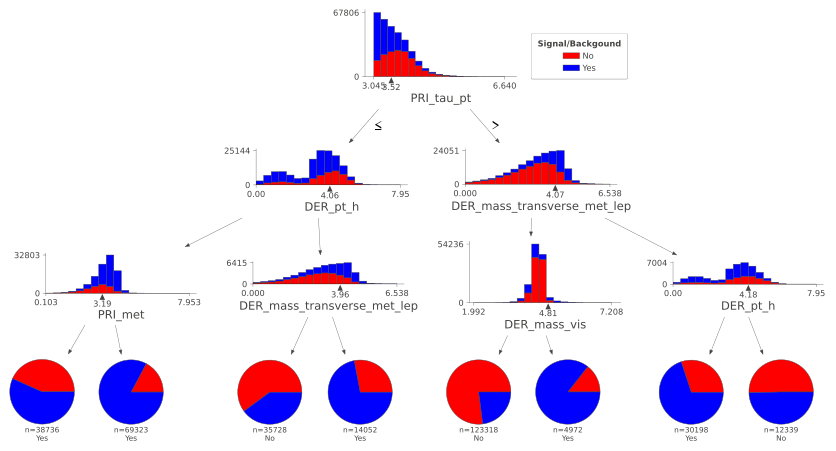

In [ ]:
vizC = dtreeviz(forest1, X_sm.iloc[:,:11],y_sm,
               feature_names = X_sm.columns[:11],
               target_name = 'Signal/Backgound', class_names= ['No','Yes']
              ,orientation = 'TD',
               colors={'classes':colors},
               label_fontsize=14,
               ticks_fontsize=10,
                scale=1.1
               )
vizC

In [ ]:
vizC.save("RandomForestClassifier1.svg")

## **Plotting and Comparing ROC Curves**

In Machine Learning, performance measurement is an essential task. So when it comes to a classification problem, we can count on an AUC - ROC Curve. When we need to check or visualize the performance of the multi-class classification problem, we use the AUC (Area Under The Curve) ROC (Receiver Operating Characteristics) curve. It is one of the most important evaluation metrics for checking any classification model’s performance. It is also written as AUROC (Area Under the Receiver Operating Characteristics).

### Interpretation of ROC Curves

An excellent model has AUC near to the 1 which means it has a good measure of separability. A poor model has AUC near to the 0 which means it has the worst measure of separability. In fact, it means it is reciprocating the result. It is predicting 0s as 1s and 1s as 0s. And when AUC is 0.5, it means the model has no class separation capacity whatsoever.

In [ ]:
def make_roc(name, clf, ytest, xtest, ax=None, labe=5,  proba=True, skip=0, initial = False):
    if not ax:
        ax=plt.gca()
    if proba:
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    roc_auc = auc(fpr, tpr)
    if skip:
        l=fpr.shape[0]
        ax.plot(fpr[0:l:skip], tpr[0:l:skip], '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    else:
        ax.plot(fpr, tpr, '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
    )
    for k in range(0, fpr.shape[0],labe):
        #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
        threshold = str(np.round(thresholds[k], 2))
        ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    if initial:
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC')
    ax.legend(loc="lower right")
    return ax

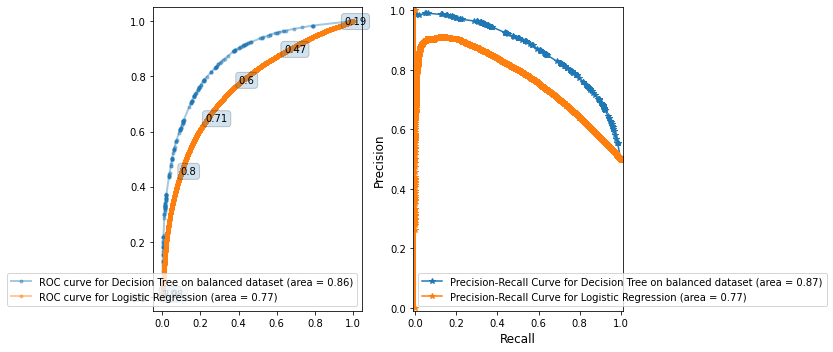

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,5))

make_roc('Decision Tree on balanced dataset', dt,ytest ,Xtest, ax=ax[0],labe=5000, initial = False)
make_roc('Logistic Regression', lr,ytest ,Xtest, ax=ax[0],labe=5000, initial = False)

make_pr('Decision Tree on balanced dataset',dt,ytest,Xtest,ax=ax[1])
make_pr('Logistic Regression',lr,ytest,Xtest,ax=ax[1])

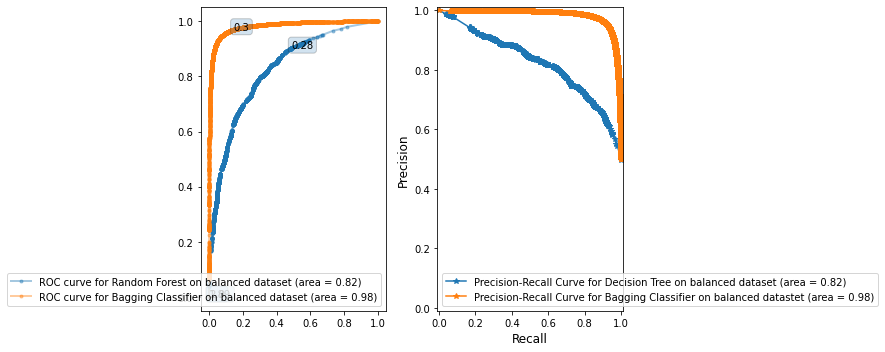

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,5))

make_roc('Random Forest on balanced dataset', random_forest,ytest ,Xtest, ax=ax[0],labe=5000, initial = False)
make_roc('Bagging Classifier on balanced dataset', bagging,ytest ,Xtest, ax=ax[0],labe=5000, initial = False)

make_pr('Decision Tree on balanced dataset',random_forest,ytest,Xtest,ax=ax[1])
make_pr('Bagging Classifier on balanced datastet',bagging,ytest,Xtest,ax=ax[1])

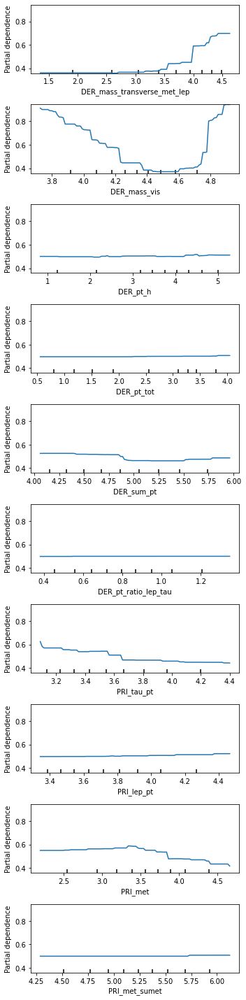

In [ ]:
from sklearn.inspection import plot_partial_dependence

#Partial Dependence for DT
fig, axes = plt.subplots(10, 1, figsize = (5, 20))
plot_partial_dependence(dt,Xtest,Xtest.columns.to_list(),ax=axes)
fig.tight_layout()

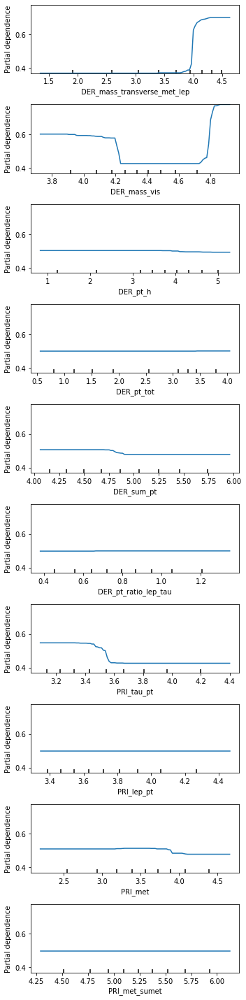

In [ ]:
#Partial Dependence for Random Forest Classifier
fig, axes = plt.subplots(10, 1, figsize = (5, 20))
plot_partial_dependence(random_forest,Xtest,Xtest.columns.to_list(),ax=axes)
fig.tight_layout()

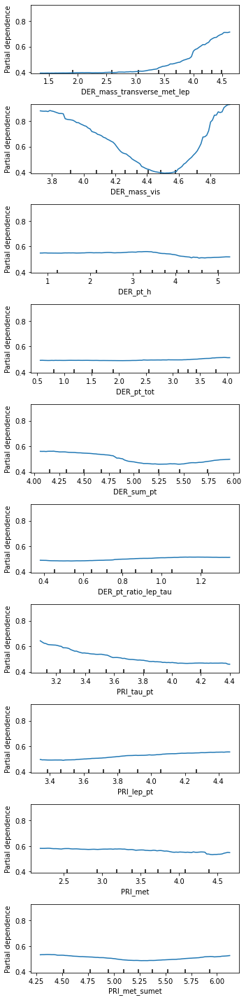

In [ ]:
#Partial Dependence for Bagging Classifier
fig, axes = plt.subplots(10, 1, figsize = (5, 20))
plot_partial_dependence(bagging,Xtest,Xtest.columns.to_list(),ax=axes)
fig.tight_layout()

# Conclusion

These are the following accuracies and F1 Score for the various classifiers used:

1. Logistic Regression - 71% Accuracy and 0.70 F1 Score
2. Decision Tree Classifier - 78% Accuracy and 0.78 F1 Score
3. Bagging Classifier - 84% Accuracy and 0.84 F1 Score
4. Random Tree Classifier - 84% Accuracy and 0.84 F1 Score

Clearly of these, the ensemble models performed better. However, we would like to further pre-process the data and fine tune the hyperparameters further in order to improve model classification.

One of the ideas we wanted to implement was self-supervised learning - which we have done in notebook called VIME_implementation.ipynb. This notebook contains our attempt at implementing the VIME algorithm for our dataset.